## Libraries

In [1]:
import torch
import torch.nn as nn
import torchvision.utils as vutils
from torch.autograd import Variable
from torch.utils.data import DataLoader

from data_util import Text2ImageDataset
from utils import process_caption, weights_init
from models.char_cnn_rnn_model import CharCNNRNN
from models.dcgan_model import Generator, Discriminator

import os
import time
import imageio
from datetime import datetime
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

## Setup

In [2]:
# Setting device to cuda
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Using Device", device)

Using Device cuda


In [3]:
# saving current date and time
date = datetime.now().strftime('%Y%m%d')
start_time = time.time()

In [4]:
# directory to store output images
output_save_path = './generated_images/'
os.makedirs(output_save_path, exist_ok=True)

In [5]:
# directory to store trained models
model_save_path = './saved_models/'
os.makedirs(model_save_path, exist_ok=True)

In [6]:
# setting up parameters
noise_dim = 100
embed_dim = 1024
embed_out_dim = 128
batch_size = 256 #128
real_label = 1.
fake_label = 0.
learning_rate = 0.0002
l1_coef = 50
l2_coef = 100

num_epochs = 250
log_interval = 18 #43

In [7]:
# loading dataset
train_dataset = Text2ImageDataset('data/birds.hdf5',split=0) # split { 0: train, 1: validation, 2: test }
train_loader = DataLoader(train_dataset, batch_size=batch_size,shuffle=True,num_workers=8)
print("No of batches: ",len(train_loader))

No of batches:  108


In [8]:
# loss functions
criterion = nn.BCELoss()
l2_loss = nn.MSELoss()
l1_loss = nn.L1Loss()

In [9]:
# lists to store losses
D_losses = []
G_losses = []

## Training

In [9]:
# initializing generator
generator = Generator(channels=3, embed_dim=embed_dim, noise_dim=noise_dim, embed_out_dim=embed_out_dim).to(device)
generator.apply(weights_init)

Generator(
  (text_embedding): Sequential(
    (0): Linear(in_features=1024, out_features=128, bias=True)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (model): Sequential(
    (0): ConvTranspose2d(228, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=Fa

In [10]:
# initializing discriminator
discriminator = Discriminator(channels=3, embed_dim=embed_dim, embed_out_dim=embed_out_dim).to(device)
discriminator.apply(weights_init)

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (text_embedding): Embedding(
    (text_embedding): Sequential(
      (0): Linear(in_features=1024, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, mo

In [ ]:
# setting up Adam optimizer for Generator and Discriminator
optimizer_G = torch.optim.Adam(generator.parameters(), lr=learning_rate, betas=(0.5, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(0.5, 0.999))

In [14]:
# training loop

# iterating over number of epochs
for epoch in range(num_epochs):
    
    batch_time = time.time()
    
    #iterating over each batch
    for batch_idx,batch in enumerate(train_loader):   
        
        # reading the data into variables and moving them to device
        images = batch['right_images'].to(device)
        wrong_images = batch['wrong_images'].to(device)
        embeddings = batch['right_embed'].to(device)
        batch_size = images.size(0)
        
        # ================================================================== #
        #                      Train the discriminator                       #
        # ================================================================== #
        
        # Clear gradients for the discriminator
        optimizer_D.zero_grad()
        
        # Generate random noise
        noise = torch.randn(batch_size, noise_dim, 1, 1, device=device)
        
        # Generate fake image batch with the generator
        fake_images = generator(noise, embeddings)
        
        # Forward pass real batch and calculate loss
        real_out, real_act = discriminator(images, embeddings)
        d_loss_real = criterion(real_out, torch.full_like(real_out, real_label, device=device))
        
        # Forward pass wrong batch and calculate loss
        wrong_out, wrong_act = discriminator(wrong_images, embeddings)
        d_loss_wrong = criterion(wrong_out, torch.full_like(wrong_out, fake_label, device=device))
        
        # Forward pass fake batch and calculate loss
        fake_out, fake_act = discriminator(fake_images.detach(), embeddings)
        d_loss_fake = criterion(fake_out, torch.full_like(fake_out, fake_label, device=device))
        
        # Compute total discriminator loss
        d_loss = d_loss_real + d_loss_wrong + d_loss_fake
        
        # Backpropagate the gradients
        d_loss.backward()
        
        # Update the discriminator
        optimizer_D.step()
        
        # ================================================================== #
        #                        Train the generator                         #
        # ================================================================== #
        
        # Clear gradients for the generator
        optimizer_G.zero_grad()
        
        # Generate new random noise
        noise = torch.randn(batch_size, noise_dim, 1, 1, device=device)
        
        # Generate new fake images using Generator
        fake_images = generator(noise, embeddings)
        
        # Get discriminator output for the new fake images
        out_fake, act_fake = discriminator(fake_images, embeddings)
        
        # Get discriminator output for the real images
        out_real, act_real = discriminator(images, embeddings)
        
        # Calculate losses
        g_bce = criterion(out_fake, torch.full_like(out_fake, real_label, device=device)) 
        g_l1 = l1_coef * l1_loss(fake_images, images)
        g_l2 = l2_coef * l2_loss(torch.mean(act_fake, 0), torch.mean(act_real, 0).detach())
        
        # Compute total generator loss
        g_loss = g_bce + g_l1 + g_l2
        
        # Backpropagate the gradients
        g_loss.backward()
        
        # Update the generator
        optimizer_G.step()
        
        # adding loss to the list
        D_losses.append(d_loss.item())
        G_losses.append(g_loss.item())
        
        # progress based on log_interval
        if (batch_idx+1) % log_interval == 0 and batch_idx > 0:
            print('Epoch {} [{}/{}] loss_D: {:.4f} loss_G: {:.4f} time: {:.2f}'.format(
                          epoch+1, batch_idx+1, len(train_loader),
                          d_loss.mean().item(),
                          g_loss.mean().item(),
                          time.time() - batch_time))
        
        # storing generator output after every 10 epochs
        if batch_idx == len(train_loader)-1 and ((epoch+1)%10==0 or epoch==0):
            viz_sample = torch.cat((images[:32], fake_images[:32]), 0)
            vutils.save_image(viz_sample,
            os.path.join(output_save_path, 'output_{}_epoch_{}.png'.format(date,epoch+1)),
                              nrow=8,normalize=True)

# saving the trained models
torch.save(generator.state_dict(), os.path.join(model_save_path, 'generator_{}.pth'.format(date)))
torch.save(discriminator.state_dict(), os.path.join(model_save_path,'discriminator_{}.pth'.format(date)))
        
print('Total train time: {:.2f}'.format(time.time() - start_time))

Epoch 1 [43/215] loss_D: 1.7006 loss_G: 27.1069 time: 13.89
Epoch 1 [86/215] loss_D: 1.6576 loss_G: 26.1355 time: 26.03
Epoch 1 [129/215] loss_D: 2.1807 loss_G: 25.1877 time: 37.82
Epoch 1 [172/215] loss_D: 1.9546 loss_G: 25.0947 time: 49.90
Epoch 1 [215/215] loss_D: 2.4211 loss_G: 26.7272 time: 60.88
Epoch 2 [43/215] loss_D: 1.5150 loss_G: 25.6626 time: 14.27
Epoch 2 [86/215] loss_D: 1.8009 loss_G: 24.6814 time: 25.58
Epoch 2 [129/215] loss_D: 1.8787 loss_G: 28.6001 time: 37.47
Epoch 2 [172/215] loss_D: 1.5062 loss_G: 26.5046 time: 48.86
Epoch 2 [215/215] loss_D: 1.9994 loss_G: 24.5951 time: 59.74
Epoch 3 [43/215] loss_D: 1.8969 loss_G: 24.8009 time: 14.37
Epoch 3 [86/215] loss_D: 1.9049 loss_G: 24.7271 time: 25.98
Epoch 3 [129/215] loss_D: 2.0859 loss_G: 26.0504 time: 37.84
Epoch 3 [172/215] loss_D: 1.4713 loss_G: 25.8143 time: 49.31
Epoch 3 [215/215] loss_D: 1.9158 loss_G: 24.2061 time: 60.18
Epoch 4 [43/215] loss_D: 1.7810 loss_G: 26.3539 time: 14.33
Epoch 4 [86/215] loss_D: 1.4177

Epoch 27 [215/215] loss_D: 2.2548 loss_G: 22.7264 time: 59.70
Epoch 28 [43/215] loss_D: 1.5600 loss_G: 25.2815 time: 14.35
Epoch 28 [86/215] loss_D: 2.2600 loss_G: 24.0087 time: 26.06
Epoch 28 [129/215] loss_D: 1.8557 loss_G: 23.2190 time: 37.89
Epoch 28 [172/215] loss_D: 1.9423 loss_G: 24.2340 time: 49.22
Epoch 28 [215/215] loss_D: 2.4551 loss_G: 24.2893 time: 60.19
Epoch 29 [43/215] loss_D: 2.0120 loss_G: 24.2362 time: 14.14
Epoch 29 [86/215] loss_D: 1.7301 loss_G: 25.5091 time: 25.41
Epoch 29 [129/215] loss_D: 1.8520 loss_G: 25.1095 time: 37.19
Epoch 29 [172/215] loss_D: 1.7861 loss_G: 24.5249 time: 48.50
Epoch 29 [215/215] loss_D: 2.1448 loss_G: 24.2409 time: 59.41
Epoch 30 [43/215] loss_D: 1.4713 loss_G: 24.6145 time: 14.35
Epoch 30 [86/215] loss_D: 1.8268 loss_G: 26.4270 time: 26.04
Epoch 30 [129/215] loss_D: 1.5805 loss_G: 24.2123 time: 37.74
Epoch 30 [172/215] loss_D: 1.8700 loss_G: 23.8603 time: 49.54
Epoch 30 [215/215] loss_D: 1.2907 loss_G: 25.2717 time: 60.58
Epoch 31 [43/2

Epoch 54 [172/215] loss_D: 1.4679 loss_G: 21.7136 time: 48.73
Epoch 54 [215/215] loss_D: 1.5325 loss_G: 23.7950 time: 59.99
Epoch 55 [43/215] loss_D: 1.5350 loss_G: 22.6137 time: 13.97
Epoch 55 [86/215] loss_D: 1.3600 loss_G: 22.2878 time: 25.66
Epoch 55 [129/215] loss_D: 1.2518 loss_G: 22.9937 time: 37.38
Epoch 55 [172/215] loss_D: 1.5134 loss_G: 23.0692 time: 48.69
Epoch 55 [215/215] loss_D: 2.0482 loss_G: 22.6000 time: 59.71
Epoch 56 [43/215] loss_D: 1.8398 loss_G: 22.0562 time: 14.57
Epoch 56 [86/215] loss_D: 1.4634 loss_G: 21.9034 time: 26.22
Epoch 56 [129/215] loss_D: 1.5718 loss_G: 21.5810 time: 38.21
Epoch 56 [172/215] loss_D: 1.4480 loss_G: 21.6145 time: 49.50
Epoch 56 [215/215] loss_D: 2.2438 loss_G: 22.1123 time: 60.65
Epoch 57 [43/215] loss_D: 1.2447 loss_G: 21.9906 time: 14.07
Epoch 57 [86/215] loss_D: 1.6946 loss_G: 22.2279 time: 25.61
Epoch 57 [129/215] loss_D: 1.3573 loss_G: 21.5826 time: 36.86
Epoch 57 [172/215] loss_D: 2.0243 loss_G: 21.4662 time: 48.66
Epoch 57 [215/

Epoch 81 [86/215] loss_D: 1.9737 loss_G: 19.1700 time: 29.16
Epoch 81 [129/215] loss_D: 1.5529 loss_G: 19.4744 time: 44.62
Epoch 81 [172/215] loss_D: 1.6987 loss_G: 18.8988 time: 60.49
Epoch 81 [215/215] loss_D: 1.4611 loss_G: 19.9947 time: 75.35
Epoch 82 [43/215] loss_D: 1.5302 loss_G: 18.7859 time: 15.94
Epoch 82 [86/215] loss_D: 1.5148 loss_G: 19.1096 time: 29.63
Epoch 82 [129/215] loss_D: 1.8263 loss_G: 18.7061 time: 44.75
Epoch 82 [172/215] loss_D: 1.2997 loss_G: 19.4081 time: 61.15
Epoch 82 [215/215] loss_D: 1.7502 loss_G: 20.8115 time: 76.63
Epoch 83 [43/215] loss_D: 1.4324 loss_G: 19.0499 time: 16.68
Epoch 83 [86/215] loss_D: 1.7034 loss_G: 18.2284 time: 30.02
Epoch 83 [129/215] loss_D: 1.4754 loss_G: 18.9383 time: 45.59
Epoch 83 [172/215] loss_D: 1.6676 loss_G: 18.8598 time: 61.03
Epoch 83 [215/215] loss_D: 1.7414 loss_G: 20.6493 time: 75.70
Epoch 84 [43/215] loss_D: 1.7420 loss_G: 18.8590 time: 15.67
Epoch 84 [86/215] loss_D: 1.4245 loss_G: 18.5186 time: 28.65
Epoch 84 [129/2

Epoch 107 [215/215] loss_D: 1.5923 loss_G: 18.7346 time: 75.13
Epoch 108 [43/215] loss_D: 1.6543 loss_G: 18.4077 time: 15.54
Epoch 108 [86/215] loss_D: 1.4497 loss_G: 18.9495 time: 28.95
Epoch 108 [129/215] loss_D: 1.5335 loss_G: 18.0696 time: 43.06
Epoch 108 [172/215] loss_D: 1.7753 loss_G: 17.6028 time: 58.37
Epoch 108 [215/215] loss_D: 1.9579 loss_G: 18.8638 time: 73.31
Epoch 109 [43/215] loss_D: 1.5425 loss_G: 17.4851 time: 15.96
Epoch 109 [86/215] loss_D: 1.6532 loss_G: 18.0648 time: 29.36
Epoch 109 [129/215] loss_D: 1.4265 loss_G: 17.9346 time: 45.80
Epoch 109 [172/215] loss_D: 1.7512 loss_G: 18.6831 time: 61.41
Epoch 109 [215/215] loss_D: 2.2496 loss_G: 17.5776 time: 76.04
Epoch 110 [43/215] loss_D: 1.7370 loss_G: 17.3695 time: 15.78
Epoch 110 [86/215] loss_D: 1.6733 loss_G: 17.9669 time: 29.33
Epoch 110 [129/215] loss_D: 1.6586 loss_G: 17.4660 time: 43.89
Epoch 110 [172/215] loss_D: 1.3923 loss_G: 17.8856 time: 60.67
Epoch 110 [215/215] loss_D: 1.6563 loss_G: 18.0563 time: 75.8

Epoch 134 [43/215] loss_D: 1.5902 loss_G: 17.2547 time: 16.36
Epoch 134 [86/215] loss_D: 1.7021 loss_G: 16.4436 time: 29.77
Epoch 134 [129/215] loss_D: 1.4148 loss_G: 16.8296 time: 45.85
Epoch 134 [172/215] loss_D: 1.4979 loss_G: 17.3804 time: 61.15
Epoch 134 [215/215] loss_D: 2.0828 loss_G: 17.0151 time: 76.80
Epoch 135 [43/215] loss_D: 1.7486 loss_G: 16.1565 time: 15.80
Epoch 135 [86/215] loss_D: 1.6482 loss_G: 17.7154 time: 29.10
Epoch 135 [129/215] loss_D: 1.8911 loss_G: 16.6950 time: 43.27
Epoch 135 [172/215] loss_D: 1.7467 loss_G: 17.0807 time: 59.49
Epoch 135 [215/215] loss_D: 1.3390 loss_G: 18.8137 time: 75.04
Epoch 136 [43/215] loss_D: 1.4810 loss_G: 17.7347 time: 15.63
Epoch 136 [86/215] loss_D: 1.7114 loss_G: 16.1356 time: 28.47
Epoch 136 [129/215] loss_D: 1.8049 loss_G: 15.9624 time: 44.03
Epoch 136 [172/215] loss_D: 1.6813 loss_G: 16.3619 time: 59.79
Epoch 136 [215/215] loss_D: 1.4193 loss_G: 19.0922 time: 75.03
Epoch 137 [43/215] loss_D: 1.5158 loss_G: 16.9938 time: 16.23

Epoch 160 [86/215] loss_D: 1.2714 loss_G: 16.2258 time: 29.02
Epoch 160 [129/215] loss_D: 1.8499 loss_G: 16.0923 time: 44.43
Epoch 160 [172/215] loss_D: 1.6495 loss_G: 17.2893 time: 59.33
Epoch 160 [215/215] loss_D: 1.3926 loss_G: 16.9246 time: 74.00
Epoch 161 [43/215] loss_D: 1.7773 loss_G: 16.9844 time: 16.26
Epoch 161 [86/215] loss_D: 1.4806 loss_G: 16.6036 time: 30.50
Epoch 161 [129/215] loss_D: 1.7728 loss_G: 16.5439 time: 45.72
Epoch 161 [172/215] loss_D: 1.9959 loss_G: 17.0450 time: 61.54
Epoch 161 [215/215] loss_D: 1.4815 loss_G: 17.9695 time: 76.27
Epoch 162 [43/215] loss_D: 1.5167 loss_G: 16.4467 time: 15.60
Epoch 162 [86/215] loss_D: 1.6730 loss_G: 16.7344 time: 28.80
Epoch 162 [129/215] loss_D: 1.7066 loss_G: 16.7262 time: 44.08
Epoch 162 [172/215] loss_D: 1.7487 loss_G: 15.5497 time: 59.55
Epoch 162 [215/215] loss_D: 1.3702 loss_G: 17.6863 time: 74.97
Epoch 163 [43/215] loss_D: 1.7002 loss_G: 17.2492 time: 16.64
Epoch 163 [86/215] loss_D: 1.5984 loss_G: 15.9101 time: 30.09

Epoch 186 [129/215] loss_D: 1.6818 loss_G: 16.9241 time: 43.18
Epoch 186 [172/215] loss_D: 1.7211 loss_G: 15.8077 time: 59.08
Epoch 186 [215/215] loss_D: 1.7621 loss_G: 16.7100 time: 73.52
Epoch 187 [43/215] loss_D: 1.5818 loss_G: 16.4813 time: 15.79
Epoch 187 [86/215] loss_D: 2.1020 loss_G: 16.7414 time: 29.44
Epoch 187 [129/215] loss_D: 1.3612 loss_G: 15.9718 time: 43.46
Epoch 187 [172/215] loss_D: 1.7131 loss_G: 16.2809 time: 59.28
Epoch 187 [215/215] loss_D: 1.6292 loss_G: 16.9830 time: 74.01
Epoch 188 [43/215] loss_D: 1.3735 loss_G: 15.9130 time: 16.47
Epoch 188 [86/215] loss_D: 1.5019 loss_G: 16.1960 time: 29.61
Epoch 188 [129/215] loss_D: 2.1046 loss_G: 16.2439 time: 43.95
Epoch 188 [172/215] loss_D: 1.6391 loss_G: 15.6961 time: 60.29
Epoch 188 [215/215] loss_D: 1.7431 loss_G: 17.2993 time: 75.60
Epoch 189 [43/215] loss_D: 1.5187 loss_G: 15.9036 time: 16.05
Epoch 189 [86/215] loss_D: 1.5120 loss_G: 15.0364 time: 29.37
Epoch 189 [129/215] loss_D: 1.7862 loss_G: 15.8732 time: 45.1

Epoch 212 [172/215] loss_D: 1.7623 loss_G: 15.8995 time: 60.73
Epoch 212 [215/215] loss_D: 1.7042 loss_G: 16.7288 time: 76.45
Epoch 213 [43/215] loss_D: 1.4562 loss_G: 15.3282 time: 16.28
Epoch 213 [86/215] loss_D: 1.5310 loss_G: 16.0283 time: 29.50
Epoch 213 [129/215] loss_D: 1.3635 loss_G: 16.9361 time: 45.03
Epoch 213 [172/215] loss_D: 1.5533 loss_G: 15.6948 time: 59.97
Epoch 213 [215/215] loss_D: 1.9132 loss_G: 17.5828 time: 74.54
Epoch 214 [43/215] loss_D: 1.5735 loss_G: 15.9165 time: 15.50
Epoch 214 [86/215] loss_D: 1.6985 loss_G: 15.1952 time: 29.14
Epoch 214 [129/215] loss_D: 1.5400 loss_G: 15.5978 time: 43.84
Epoch 214 [172/215] loss_D: 1.4156 loss_G: 15.9166 time: 59.69
Epoch 214 [215/215] loss_D: 1.5304 loss_G: 17.1647 time: 73.60
Epoch 215 [43/215] loss_D: 1.4015 loss_G: 15.7902 time: 15.77
Epoch 215 [86/215] loss_D: 1.5070 loss_G: 15.0204 time: 28.89
Epoch 215 [129/215] loss_D: 1.8462 loss_G: 16.3752 time: 43.80
Epoch 215 [172/215] loss_D: 1.6706 loss_G: 16.3764 time: 59.3

Epoch 238 [215/215] loss_D: 1.7727 loss_G: 16.3539 time: 75.14
Epoch 239 [43/215] loss_D: 1.4581 loss_G: 15.8380 time: 15.77
Epoch 239 [86/215] loss_D: 1.6331 loss_G: 16.1068 time: 29.12
Epoch 239 [129/215] loss_D: 1.7571 loss_G: 14.7718 time: 45.02
Epoch 239 [172/215] loss_D: 1.6386 loss_G: 15.4964 time: 59.64
Epoch 239 [215/215] loss_D: 1.5244 loss_G: 17.0016 time: 75.23
Epoch 240 [43/215] loss_D: 1.8322 loss_G: 16.1774 time: 15.66
Epoch 240 [86/215] loss_D: 1.7484 loss_G: 15.1069 time: 28.87
Epoch 240 [129/215] loss_D: 1.7828 loss_G: 16.1879 time: 43.52
Epoch 240 [172/215] loss_D: 1.4795 loss_G: 15.7841 time: 59.14
Epoch 240 [215/215] loss_D: 1.6131 loss_G: 15.9972 time: 74.77
Epoch 241 [43/215] loss_D: 1.6643 loss_G: 15.3919 time: 16.89
Epoch 241 [86/215] loss_D: 1.4574 loss_G: 15.5043 time: 30.42
Epoch 241 [129/215] loss_D: 1.5090 loss_G: 15.5846 time: 45.26
Epoch 241 [172/215] loss_D: 1.4160 loss_G: 16.0196 time: 61.71
Epoch 241 [215/215] loss_D: 1.7856 loss_G: 16.4255 time: 77.1

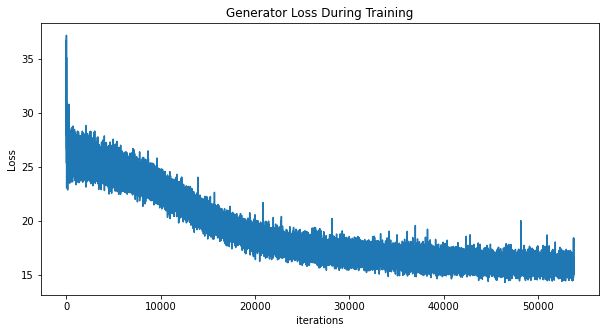

<Figure size 432x288 with 0 Axes>

In [15]:
# generator loss plot
plt.figure(figsize=(10,5))
plt.title("Generator Loss During Training")
plt.plot(G_losses)
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.show()

plt.savefig(os.path.join(output_save_path, 'output_generatorLoss_{}.png'.format(date)))

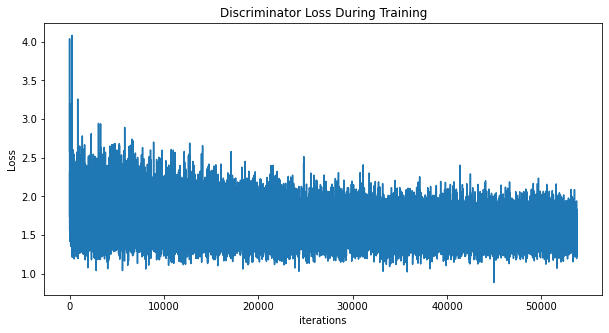

<Figure size 432x288 with 0 Axes>

In [16]:
# discriminator loss plot
plt.figure(figsize=(10,5))
plt.title("Discriminator Loss During Training")
plt.plot(D_losses)
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.show()

plt.savefig(os.path.join(output_save_path, 'output_discriminatorLoss_{}.png'.format(date)))

## Visualize output

In [18]:
# Get all file names from the "generated_images" directory
file_names = os.listdir(output_save_path)
file_names = [name for name in file_names if name.startswith('output_{}_'.format(date))]

# Sort the file names numerically
file_names = sorted(file_names, key=lambda name: int(name.split('_')[3].split('.')[0]))

# Create a list to store the read images
images = []

for file_name in file_names:
    images.append(imageio.imread(os.path.join(output_save_path,file_name)))

imageio.mimsave(os.path.join(output_save_path, 'output_gif_{}.gif'.format(date)), images, fps=1) 

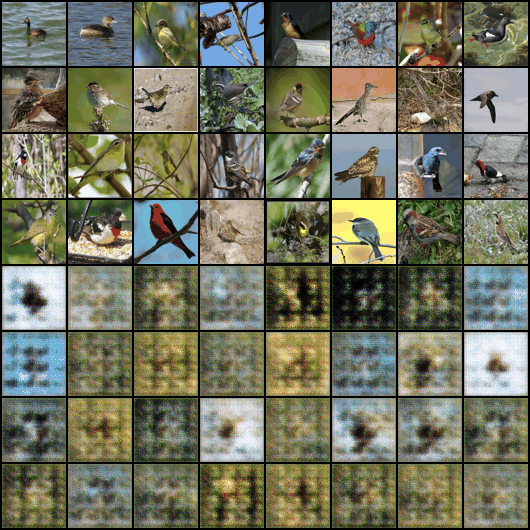

In [19]:
from IPython.display import Image

# Load the GIF
with open(os.path.join(output_save_path, 'output_gif_{}.gif'.format(date)),'rb') as file:
    display(Image(file.read()))